In [37]:
import pandas as pd
import numpy as np
import nltk, itertools
from gensim.models import Word2Vec
import nltk, os
import tensorflow as tf
import itertools
import random

In [38]:
#taking the original dataset:

file_data = open('gh_create_all_fields_cleaned_data.txt', 'rt')
# reading the sentences:
sentences=file_data.read()
sentences=sentences.split('\n')



In [39]:
#importing randomly selected 50 sentenes from the OG dataset:
import random
train_sent=[]

for i in range(100):
    num = random.randrange(0, len(sentences))
    train_sent.append(sentences[num])
    
# train_sent.append("$& $$& i love $pence is $$&")


In [40]:
 out, inp = [" ".join(x.split()[1:]) for x in train_sent], [" ".join(x.split()[:1]) for x in train_sent]

In [41]:
table_map=dict()
out_map=dict()
for index, val in enumerate(out):
    table_map[inp[index]]=out[index]
    out_map[out[index]]=inp[index]
train_sent=[]
for key in out_map:
    sent="$"+out_map[key]+"&"+" "+key
    train_sent.append(sent)


In [42]:
# table_map

In [43]:
print(len(train_sent))

100


In [44]:
# importing the essential visualization parameters:
from d2l import tensorflow as d2l
import math
import numpy as np
import tensorflow as tf

batch_size, num_steps = 32, 35
train_iter, vocab = d2l.load_data_time_machine(batch_size, num_steps)

train_random_iter, vocab_random_iter = d2l.load_data_time_machine(
    batch_size, num_steps, use_random_iter=True)



In [45]:
char_data =""

for sent in train_sent:
    char_data+=sent+"\n"

chars= list(set(char_data))

#create dictionary mapping for each char
char_to_ix = {ch:i for (i,ch) in enumerate(chars)}
ix_to_char = {i:ch for (i,ch) in enumerate(chars)}

In [46]:
# defining a function for getting all the parameters:
def get_params2(vocab_size, num_hidden):
    num_inputs = num_outputs = vocab_size

    def normal(shape):
        return tf.random.normal(shape=shape,stddev=0.01,mean=0,dtype=tf.float32)

    # Hidden layer parameters
    E = tf.Variable(normal((vocab_size, 10)), dtype=tf.float32)
    W_xh = tf.Variable(normal((num_inputs, num_hiddens)), dtype=tf.float32)
    W_hh = tf.Variable(normal((num_hiddens, num_hiddens)), dtype=tf.float32)
    b_h = tf.Variable(tf.zeros(num_hiddens), dtype=tf.float32)
    # Output layer parameters
    W_hq = tf.Variable(normal((num_hiddens, num_outputs)), dtype=tf.float32)
    b_q = tf.Variable(tf.zeros(num_outputs), dtype=tf.float32)
    M = tf.Variable(tf.random.uniform([W_xh.shape[1], vocab_size], dtype=tf.float32))
    params = [W_xh, W_hh, b_h, W_hq, b_q, E, M]
#     params = [W_xh, W_hh, b_h, W_hq, b_q]
    return params

In [47]:
# function for converting numpy vectors into tensorflow vectors:
def my_func(arg):
    arg = tf.convert_to_tensor(arg, dtype=tf.float32)
    return arg

In [48]:
def init_rnn_state2(batch_size, num_hiddens):
    return (tf.zeros((batch_size, num_hiddens)), )

In [49]:
def rnn2(inputs, state, params, curr_sent, vocab_size, word2vec_model):
    # Here `inputs` shape: (`num_steps`, `batch_size`, `vocab_size`)
    W_xh, W_hh, b_h, W_hq, b_q,E, M = params
    
    # calculating the values from the encoder function
    result=tf.zeros([vocab_size, 1], tf.float32)
    for every_char in curr_sent:
        tfcharEmb = my_func(word2vec_model[every_char])
        tfcharEmb=tf.reshape(tfcharEmb, [10, 1])
        result+= tf.matmul(E, tfcharEmb)
        
#     M=tf.random.uniform([W_xh.shape[1], vocab_size], dtype=tf.float32)
    H, = state
    outputs = []

#     print('Printing the inputs:')
#     print(inputs)
#     print('Printing the Shape:')
#     print(inputs.shape)
    for X in inputs:
#         print("input",X.shape)
        X = tf.reshape(X,[-1,W_xh.shape[0]])
        a= tf.matmul(X, W_xh)
        b= tf.matmul(H, W_hh)
        c = tf.matmul(M, result)
        c =  tf.reshape(c, [c.shape[1], c.shape[0]])
        H = tf.nn.sigmoid(a + b + c + b_h, name='sigmoid')
        Y = tf.matmul(H, W_hq) + b_q
        y_out = tf.nn.softmax(Y)
#         print("Yshape",Y.shape)
        outputs.append(y_out)
    return tf.concat(outputs, axis=0), (H,)

In [50]:
class RNNModelScratch2: #@save
    """A RNN Model implemented from scratch."""
    def __init__(self, vocab_size, num_hiddens,
                 init_state, forward_fn, word2vec):
        self.vocab_size, self.num_hiddens = vocab_size, num_hiddens
        self.init_state, self.forward_fn = init_state, forward_fn
        self.word2vec=word2vec

    def __call__(self, X, state, params, curr_sent):
        print(X, X.shape)
        X = tf.one_hot(tf.transpose(X), self.vocab_size)
        X = tf.cast(X, tf.float32)
        return self.forward_fn(X, state, params, curr_sent, self.vocab_size, self.word2vec)

    def begin_state(self, batch_size):
        return self.init_state (batch_size, self.num_hiddens)
    

In [51]:
def train(model, params, table_map, out_map,char_to_ix, ix_to_char):
    "traing the modified model"
    state=None
    
    threshold = 0.05
    lr=1
    loss = tf.keras.losses.CategoricalCrossentropy()
    updater = tf.keras.optimizers.SGD(lr)
    optimizer = tf.keras.optimizers.Adam()
    loss_res=[] # storage for the resultant loss
    loss_epochs = [] #keeping of the loss per epoch
    epochs = 1200
    metric = d2l.Accumulator(2)
    timer=d2l.Timer()
    
    
    while epochs>0:
        
        loss_per_epoch=0
        
        for column in out_map:
            
            every_table = out_map[column]
            
            #padding the current word
            target_word = "$"+every_table+"&"
#             print("target word -> ",target_word)
            
            input_str = target_word[0:len(target_word)-1]
            target_str = target_word[1:len(target_word)]
            
            inputs = [char_to_ix[ch] for ch in input_str]
            targets = [char_to_ix[ch] for ch in target_str]
            
            X = tf.reshape(tf.Variable(inputs), (1, len(inputs)))
            Y_out = tf.reshape(tf.Variable(targets), (1, len(targets)))
            Y_true=tf.one_hot(Y_out, len(char_to_ix),on_value=1.0, off_value=0.0,axis=-1)
            Y_true=Y_true[0];
            
            
            # The actual crux of training the data:
            
            if state is None:
                
                state = model.begin_state(batch_size=X.shape[0])
                
            with tf.GradientTape(persistent=True) as g:
#                 print('I am here 1')
                g.watch(params)
                y_hat, state= model(X, state, params, column)
                y = tf.reshape(Y_out, (-1))
                axis_0 = np.shape(y_hat.numpy())[0]
                axis_1 = np.shape(y_hat.numpy())[1]
                Y_true=tf.reshape(Y_true, [axis_0, axis_1])
                # calculating the loss
                l = loss(Y_true, y_hat)
                
#             print(l)
            
#             print('I am here 2')
            grads = g.gradient(l, params)
            grads = grad_clipping(grads, 1)
            optimizer.apply_gradients(zip(grads, params))
#             updater.apply_gradients(zip(grads, params))
#             print('I am here 3')
            metric.add(l * tf.size(y).numpy(), tf.size(y).numpy())
            loss_per_epoch=l
            
        # after every epoch
        loss_epochs.append(loss_per_epoch)
        loss_res.append(math.exp(metric[0] / metric[1]))
        epochs=epochs-1
    return loss_epochs, loss_res



In [52]:
def grad_clipping(grads, theta): #@save
    """Clip the gradient."""
    theta = tf.constant(theta, dtype=tf.float32)
    norm = tf.math.sqrt(sum((tf.reduce_sum(grad ** 2)).numpy()
                        for grad in grads))
    norm = tf.cast(norm, tf.float32)
    new_grad = []
    if tf.greater(norm, theta):
        for grad in grads:
            new_grad.append(grad * theta / norm)
    else:
        for grad in grads:
            new_grad.append(grad)
    return new_grad

In [53]:
# functions to calculate word tokenizations and tokenizers:
# which would be later used for calculating the word to 

def filter_words(sentence):
    ll = [[nltk.word_tokenize(w), ' '] for w in sentence.split()]
#     print(list(itertools.chain(*list(itertools.chain(*ll)))))
#     return [word.lower() if word.isalpha() else " " for word in [nltk.word_tokenize(sentence), " "]]
    return list(itertools.chain(*list(itertools.chain(*ll))))

def tokenize(text):
    return [filter_words(sentence) for sentence in nltk.sent_tokenize(text)]





In [54]:
tokenized_words=[]
sent_data=[]
for sentence in out:
    sent_mod=''
    for char in sentence:
        sent_mod+=char+' ' 
#     print(sent_mod)
#     print(nltk.sent_tokenize(sent_mod))
    tokenized_words.extend(tokenize(sent_mod))
    sent_data.append(sentence)

word2vec_model = Word2Vec(tokenized_words, 
                          sg=1,  # here we will use skipgram 0 is for CBROW; skip gram is for smaller models 
                          size=10,
                          min_count=1 # word needs to occur atleast once
                         )
 
num_hiddens = 512        # declaration of number of hidden layers
lr=0.1                   # declaration of regularization parameter
seq_len=10               # this is a sequence length
updater = tf.keras.optimizers.SGD(lr)
# data_reader = DataReader("temp.txt", seq_len)
#defining the required params:
params = get_params2(len(chars), num_hiddens)




In [55]:
model=RNNModelScratch2(len(chars), num_hiddens, init_rnn_state2, rnn2, word2vec_model)
loss_res, loss_epochs=train(model, params, table_map,out_map, char_to_ix, ix_to_char)




tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)


/Users/kedargn94/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtyp

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), d

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tenso

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], s

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 2

tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)


tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[1

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tenso

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtyp

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)


tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), d

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 1

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 1

tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dt

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[1

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtyp

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.T

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype

tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.T

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 1

tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), d

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 2

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)


tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tenso

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)


tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[1

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[1

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=i

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.T

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 1

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 2

tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 1

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtyp

tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32)

tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tenso

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tens

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.T

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32)

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1,

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (

tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 2

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([

tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), d

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtyp

tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.T

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape

tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.T

tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int

tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 2

tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
t

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), d

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 1

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10)

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1,

tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6

tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 2

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), d

tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 2

tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1

tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 

tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.

tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([

tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], s

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int3

tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 

tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) 

tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], s

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  

tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dty

tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor(

tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14 

tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dty

tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[1

tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=in

tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int3

tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], s

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 10  3 14 16]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4  5  3 10 17 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8

tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 22  9  9  3 21  6  5 17  8 28 23 15  7]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 10  7 15 21 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 19 17 15 14  6 17  5]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 15 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 15  5 17  6 28 22 21 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 17 29 17  5 17 25 10 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 15 10 10 28 22 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  3 25 29  5 15 21 14  5 22 10 14 22  5 17]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor(

tf.Tensor([[11  6 17 15  5 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 26  5 25 28  9 17 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  9 15 25 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 22  5 10  6 15 21 17  4 15 16  8 17 25 14]], shape=(1, 16), dtype=int32) (1, 16)
tf.Tensor([[11  4  7 15 16 17  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 21 14 22 26 17 25 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 14 21 17  5 23  3 10 17]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 16 21 14 17  8 25 28 14  3 10 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 15 26 26  5 17 21 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  9 15 25 25 17  5 29  3 25  3 21  6]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 

tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 14 17 15  8]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  7  3 21 14 14 15  9  7 17 28 25 21 14  5  3 25  2]], shape=(1, 18), dtype=int32) (1, 18)
tf.Tensor([[11 14 17 15  8 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  5 21 21  3 25 29 28]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  7 28  2 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6

tf.Tensor([[11  8 28 26 22  7 17 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 10 22 21 14 28  8 17  5]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 10 28  8  8 17 25 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 25 17 19 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 14 17 24 14]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4 28 21 14 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 23  3 17 19 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 17 26  3 14 15  9  7 17  5 15 26  3 28 28  4 14  3 28 25]], shape=(1, 20), dtype=int32) (1, 20)
tf.Tensor([[11  4 17  5 21 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 25 28 14  3 29  3 10 15 14  3 28 25  8 17 21 21 15  2 17 21]], shape=(1, 21), dtype=int32) (1, 21)
tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7),

tf.Tensor([[11 21 17  5 23  3 10 17 14 16  4 17 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 21 17 15  5 10  6]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 17 10 28  5 26]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17  7  4]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 28  5 26 17  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 22 14  6 28  5 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  6 28 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 21 14 15 14  3 21 14  3 10 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 22 21 17  5  3  8 15  2 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11  5 28  7 17 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8

tf.Tensor([[11 14 26  3 21 15  9  7 17 29  3 17  7 26]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  9 28 28 20 21 15 22 14  6 28  5 21]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  8  3 25  3 28 25 21]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  4  5 28  0 17 10 14 21]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 15  2]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 15 22 14  6 28  5 15  5 14  3 10  7 17]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  6  3  2  6 21 10 28  5 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11 15 10 14  3 23  3 14 16]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11  8 22 21  3 10 14 16  4 17]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 10  7  3 17 25 14]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int3

tf.Tensor([[11  4  6 28 14 28]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 14 22 14 28  5 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 10 15  5 14  3 14 17  8]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 14 17 24 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11 10 28 25 21 14]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  6 17 15  5 14  5 15 14 17 21]], shape=(1, 11), dtype=int32) (1, 11)
tf.Tensor([[11  8 16 14 15  9  7 17]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11 19 28  5 20  6 28 22  5 21  7 28  2 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 15 25  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 20  3 26]], shape=(1, 4), dtype=int32) (1, 4)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (

tf.Tensor([[11 21 22  9 19 15 16]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 22  4  4  7  3 17  5 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 19 28  5 26 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  5 17  7 15 14  3 28 25]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 21 17  5 23  3 10 17 21 14 16  4 17 21]], shape=(1, 14), dtype=int32) (1, 14)
tf.Tensor([[11  5 17 21 28 22  5 10 17 14 16  4 17]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11 14 17 21 14]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  9  3  9  7  3 28  2  5 15  4  6  3 17 21]], shape=(1, 15), dtype=int32) (1, 15)
tf.Tensor([[11 15  4  4 21]], shape=(1, 5), dtype=int32) (1, 5)
tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 2

tf.Tensor([[11  4 17  5 21 28 25]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 26  8  3 25]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 21 17 21 21  3 28 25]], shape=(1, 8), dtype=int32) (1, 8)
tf.Tensor([[11  5 17 21 28 22  5 10 17 21]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 22 21 17  5 21]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  3 25 23 17 25 14 28  5 16]], shape=(1, 10), dtype=int32) (1, 10)
tf.Tensor([[11 21 14 15  2 17]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11  8 28 25 14  6 21]], shape=(1, 7), dtype=int32) (1, 7)
tf.Tensor([[11 15 10 14 28  5]], shape=(1, 6), dtype=int32) (1, 6)
tf.Tensor([[11 29 22 25 10 14  3 28 25 26 17 29  3 25  3 14  3 28 25]], shape=(1, 19), dtype=int32) (1, 19)
tf.Tensor([[11  4  7 22  2  3 25 28  4 14  3 28 25]], shape=(1, 13), dtype=int32) (1, 13)
tf.Tensor([[11  5 17 10 17  4 14 15  3]], shape=(1, 9), dtype=int32) (1, 9)
tf.Tensor([[11 29 17 17 26  9 15 10 20 15 14 14 15 10  6  8 17 25 14]], shape=(1, 1

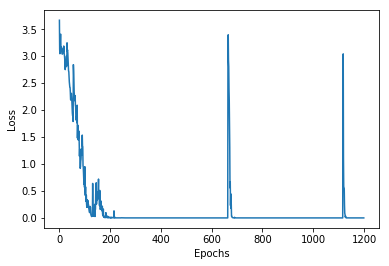

In [60]:
import matplotlib.pyplot as plt
plt.plot(loss_res)
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.show()

In [56]:
# predict function:

def predict_chars(curr_char, num_preds, model, params, collumns, char_to_ix, ix_to_char):
    
    outputs = [char_to_ix[curr_char[0]]] # having a series of inputs in line
    X = tf.reshape(tf.Variable(outputs), (1, len(outputs))) # reshaping the input variable
    state = model.begin_state(batch_size=1) #initializing the earlier state
    get_inputs = lambda: tf.reshape(tf.constant([outputs[-1]]),(1,1)).numpy()

    for y in curr_char[1:]:
        _, state= model(get_inputs(), state, params, collumns)
        outputs.append(char_to_ix[y])
    
    currChar=''
    while currChar!='&':
        y, state = model(get_inputs(), state, params, collumns)
        try:
            output=np.random.multinomial(1, y[0], size=1)
            y=output
            y=my_func(y)
        except:
            y=y
        currIndex=y.numpy().argmax(axis=1)[0]
        currChar=ix_to_char[currIndex]
        outputs.append(int(y.numpy().argmax(axis=1).reshape(1)))
        
    return ''.join([ix_to_char[i] for i in outputs])

# predict_chars('$', 5, model, vocab, params)



In [81]:
predicted_table_names=[]
for key in table_map:
    table_name=predict_chars("$", 10, model, params, table_map[key], char_to_ix, ix_to_char)
    predicted_table_names.append(table_name)

/Users/kedargn94/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


In [82]:
predicted_table_names

['$dsdsdedity&',
 '$dsdares&',
 '$deded&',
 '$ditiscounts&',
 '$dpfficial&',
 '$dederguthority&',
 '$dstsioritocer&',
 '$dsdldedsemccoons&',
 '$ditisious&',
 '$dsdsdemity&',
 '$dofficial&',
 '$cshows&',
 '$dedsdecustomer&',
 '$dpdaici&',
 '$sshows&',
 '$dsdares&',
 '$dsdors&',
 '$dedld&',
 '$dofficials&',
 '$dedld&',
 '$dsdares&',
 '$dedsdccus&',
 '$dsdades&',
 '$dsdacem&',
 '$sshows&',
 '$deded&',
 '$dstsioritp&',
 '$dedsicaseorces&',
 '$deded&',
 '$dsdsicasescores&',
 '$dsfficiols&',
 '$dsdors&',
 '$dedldcdus&',
 '$deded&',
 '$ushows&',
 '$dedldcdus&',
 '$dedldccustomers&',
 '$dshors&',
 '$dndldcdader&',
 '$dstsiority&',
 '$dstsiorgescornt&',
 '$dsdsdeditl&',
 '$dsdades&',
 '$deder&',
 '$dedsiors&',
 '$dsdares&',
 '$dedededusew&']

In [86]:

for key in table_map.keys():
    print(key)



tppriority
collectionplatform
partsneeded
discounts
staffmember
userauthority
challenges
tasks
requestsdecisions
official
images
emergencycontacts
users
minigamescores
sighashes
player
imports
contacts
userimage
playlist
chatmessages
news
article
user
shows
country
title
roomsearch
post
sessions
settings
notes
shipcargo
customers
section
applications
facebook
version
account
accounts
dbgroup
passwd
blocks
bank
workrecords
tableupdates
usergroup


In [251]:
print(softmax[0])

output=np.random.multinomial(1, softmax[0], size=1)

np.sum([x for x in softmax])

tf.Tensor(
[1.0414236e-11 1.4816216e-11 1.5696678e-13 3.9458456e-08 3.2818798e-06
 2.8328517e-07 8.1779090e-06 7.7858327e-14 1.1366105e-06 4.3826469e-05
 4.5244697e-08 1.1063100e-08 3.8613056e-08 2.2470122e-14 9.5597459e-03
 5.8253011e-08 4.5297021e-08 6.3407099e-11 9.4336542e-08 1.6842714e-05
 2.0491355e-09 9.8059285e-01 9.7398711e-03 2.6432825e-05 6.5614472e-06
 6.0639121e-07 1.2288762e-12 4.4003642e-08], shape=(28,), dtype=float32)


1.0

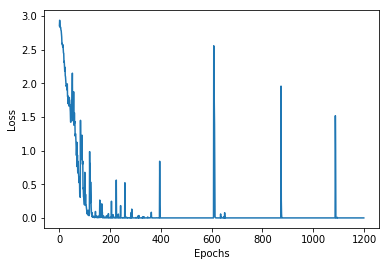

In [87]:
import matplotlib.pyplot as plt
plt.plot(loss_res)
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.show()

In [88]:
len(test_cols)

30

In [102]:
test_cols=[]
for _ in range(40):
    sent = random.choice(out)
    test_cols.append(sent)

In [110]:
pred_tables=[]
for cols in out:
    table = predict_chars("$", 10, model, params, cols, char_to_ix, ix_to_char)
    pred_tables.append(table)

# len(test_cols)

[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[15]] (1, 1)
[[5]] (1, 1)
[[21]] (1, 1)
[[11]] (1, 1)


/Users/kedargn94/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


[[21]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[15]] (1, 1)
[[5]] (1, 1)
[[21]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[15]] (1, 1)
[[5]] (1, 1)
[[21]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[16]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[17]] (1, 1)
[[8]] (1, 1)
[[25]] (1, 1)
[[28]] (1, 1)
[[14]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11

[[21]] (1, 1)
[[11]] (1, 1)
[[22]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[15]] (1, 1)
[[9]] (1, 1)
[[7]] (1, 1)
[[17]] (1, 1)
[[28]] (1, 1)
[[25]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[5]] (1, 1)
[[3]] (1, 1)
[[25]] (1, 1)
[[2]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[14]] (1, 1)
[[21]] (1, 1)
[[17]] (1, 1)
[[5]] (1, 1)
[[23]] (1, 1)
[[3]] (1, 1)
[[10]] (1, 1)
[[17]] (1, 1)
[[11]] (1, 1)
[[21]] (1, 1)
[[21]] (1, 1)
[[22]] (1, 1)
[[9]] (1, 1)
[[19]] (1, 1)
[[15]] (1, 1)
[[16]] (1, 1)
[[11]] (1, 1)
[[21]]

In [111]:
pred_tables = [each[1:-1] for each in pred_tables]

In [130]:
actual_names =[out_map[each] for each in out]


# random_samp=[]
# for _ in range(6):
#     random_samp.append(predict_chars("$", 10, model, params, 'id username password role email created modified', char_to_ix, ix_to_char))
actual_names

['search',
 'record',
 'roles',
 'help',
 'orders',
 'authors',
 'host',
 'statistics',
 'userimage',
 'roles',
 'tdisablefield',
 'booksauthors',
 'minions',
 'projects',
 'tag',
 'authorarticle',
 'highscores',
 'activity',
 'musictype',
 'client',
 'photo',
 'tutors',
 'cartitem',
 'text',
 'const',
 'heartrates',
 'mytable',
 'workhourslogs',
 'range',
 'kid',
 'users',
 'subway',
 'users',
 'suppliers',
 'words',
 'relation',
 'servicestypes',
 'resourcetype',
 'test',
 'bibliographies',
 'apps',
 'person',
 'admin',
 'session',
 'resources',
 'users',
 'inventory',
 'stage',
 'months',
 'actor',
 'functiondefinition',
 'pluginoption',
 'receptai',
 'feedbackattachment',
 'test',
 'authors',
 'users',
 'city',
 'prices',
 'users',
 'rubbishremoval',
 'class',
 'weather',
 'authors',
 'reasons',
 'warehouse',
 'reference',
 'accounts',
 'infrastructure',
 'heart',
 'drnobet',
 'users',
 'bans',
 'purchasepayment',
 'players',
 'student',
 'tservice',
 'systemnotice',
 'address',
 '

In [131]:
len(actual_names)

100

In [132]:
columns =['Actual Data', 'Predicted Data']
data = pd.DataFrame(columns =columns)

data['Predicted Data'] = pred_tables[60:]
data['Actual Data'] = actual_names[60:]

In [133]:
data

,Actual Data,Predicted Data
0,rubbishremoval,stservico
1,class,ssubway
2,weather,wxrtherx
3,authors,ophter
4,reasons,rtsjfnb
5,warehouse,wbearhgose
6,reference,ssears
7,accounts,usubway
8,infrastructure,stservice
9,heart,stservice


In [122]:
out_map.values()

dict_values(['search', 'record', 'roles', 'help', 'orders', 'authors', 'host', 'statistics', 'userimage', 'roles', 'tdisablefield', 'booksauthors', 'minions', 'projects', 'tag', 'authorarticle', 'highscores', 'activity', 'musictype', 'client', 'photo', 'tutors', 'cartitem', 'text', 'const', 'heartrates', 'mytable', 'workhourslogs', 'range', 'kid', 'users', 'subway', 'users', 'suppliers', 'words', 'relation', 'servicestypes', 'resourcetype', 'test', 'bibliographies', 'apps', 'person', 'admin', 'session', 'resources', 'users', 'inventory', 'stage', 'months', 'actor', 'functiondefinition', 'pluginoption', 'receptai', 'feedbackattachment', 'test', 'authors', 'users', 'city', 'prices', 'users', 'rubbishremoval', 'class', 'weather', 'authors', 'reasons', 'warehouse', 'reference', 'accounts', 'infrastructure', 'heart', 'drnobet', 'users', 'bans', 'purchasepayment', 'players', 'student', 'tservice', 'systemnotice', 'address', 'bannerfinish', 'test', 'team', 'listtableonstring', 'teams', 'logs'